# Analysis of the pretrained facenet

## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
import sklearn
import scipy
import seaborn as sns

In [2]:
import tqdm
#from tqdm import tqdm
from tqdm.notebook import tqdm # for notebooks
tqdm.pandas()

In [3]:
import pickle
import gc
collectAll = lambda : gc.collect(0) + gc.collect(1) + gc.collect(2)

In [4]:
#from pandarallel import pandarallel
#pandarallel.initialize(progress_bar=True)

In [5]:
#import itables
#from itables import show

In [6]:
from collections import namedtuple
import itertools
from itertools import product

In [7]:
from skimage.feature import graycomatrix
from skimage.feature import graycoprops
from math import pi

In [8]:
import PIL as pil
from PIL import Image, ImageDraw

In [9]:
#import papermill as pm

In [10]:
import math

In [11]:
import matplotlib
matplotlib.rcParams["image.origin"] = 'upper'

In [12]:
import os

In [13]:
import functools

In [14]:
import tensorflow as tf

In [15]:
import torch
import torchvision

In [16]:
from einops import *

In [17]:
import cv2

In [18]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 4 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


In [19]:
import networkx as nx

## Load in the pretrained facenet

In [20]:
import model
from model import face_model

In [21]:
import importlib
model = importlib.reload(model)
face_model = model.face_model

In [22]:
class Params():
    def __init__(self):
        self.image_size = 250
        self.embedding_size=128

In [23]:
fm_old = face_model(Params())

In [24]:
checkpoint = tf.train.Checkpoint(fm_old)

In [25]:
checkpoint.restore('../weights/weights/ckpt/ckpt-11')

In [26]:
fm.save('model.keras')

NameError: name 'fm' is not defined

In [ ]:
!mkdir saved_model
fm.save('saved_model/my_model')

In [ ]:
import onnx
from onnx2torch import convert
onnx_model_path = 'model.onnx'
onnx_model = onnx.load(onnx_model_path)
torch_model_1 = convert(onnx_model)

In [ ]:
torch.cuda.is_available()

In [ ]:
fm = torch_model_1

In [ ]:
device = torch.device('cuda:0')

In [ ]:
fm = fm.to(device)

## Load in our data

In [28]:
from pathlib import Path
result = Path("./glcms_3_7_128").rglob("*.npz")

In [29]:
df = pd.DataFrame(result, columns=['npz_path'])

In [30]:
df['path_str_split'] = df['npz_path'].apply(lambda x: str(x)).str.split('\\')

In [31]:
df['phase'] = df['path_str_split'].apply(lambda x: x[1]).astype("category")

In [32]:
df['filename'] = df['path_str_split'].apply(lambda x: x[-1])

In [33]:
df[['species', 'tree_id']] = df['filename'].str.split('_').apply(lambda x: pd.Series(x[:2]))

In [34]:
df['species'] = df['species'].astype('category')

In [35]:
df['tree_id'] = df['tree_id'].str.split('.').apply(lambda x: x[0]).astype("int")

In [36]:
df_nv = df[['npz_path', 'phase', 'species', 'tree_id']]

In [37]:
df_nv.head()

,npz_path,phase,species,tree_id
0,glcms_3_7_128\10May2021\3rad_7step_128bins_1xD...,10May2021,Alstonia Angulstiloba,14
1,glcms_3_7_128\10May2021\3rad_7step_128bins_1xD...,10May2021,Alstonia Angulstiloba,20
2,glcms_3_7_128\10May2021\3rad_7step_128bins_1xD...,10May2021,Bridelia Sp.,2
3,glcms_3_7_128\10May2021\3rad_7step_128bins_1xD...,10May2021,Bridelia Sp.,22
4,glcms_3_7_128\10May2021\3rad_7step_128bins_1xD...,10May2021,Calophyllum,25


In [38]:
def get_glcm(filename_or_arr, is_filename=True):
    if is_filename:
        arr = np.load(filename_or_arr, allow_pickle=True)
    else:
        arr = filename_or_arr
    rval = arr
    return rval

In [39]:
df['glcm'] = df['npz_path'].progress_apply(lambda x: get_glcm(x))

  0%|          | 0/66 [00:00<?, ?it/s]

In [40]:
df['glcm'].iloc[0].shape

(238, 266, 8, 7)

In [41]:
#df = df[df['species'] != 'Cratoxylum Formosum']

In [42]:
#df = df[df['glcm'].apply(lambda x: x.shape[0]) >= 64]
#df = df[df['glcm'].apply(lambda x: x.shape[1]) >= 64]

In [43]:
len(df)

66

## Make sense of our channel ordering

Wideband Red = 0, Wideband Green = 1, Wideband Blue = 2, RedEdge = 3, Blue = 4, NIR = 5, Red = 6, Green = 7

NONE = 0, HOMOGENEITY = 1, CONTRAST = 2, ASM = 3, MEAN_I = 4, VAR_I = 5, CORRELATION = 6

In [44]:
bands = ['wr', 'wg', 'wb', 're', 'b', 'ni', 'r', 'g']

In [45]:
filters = ['none', 'homogeneity', 'contrast', 'asm', 'mean', 'var', 'correlation']

## Duplicate how Aaron did it

### Feature selection

Bands used: Red-Edge, Narrowband Blue, NIR, Narrowband Red, Narrowband Green

GLCM filters used: None, GLCM Mean.

In [46]:
selected = list(itertools.product(('none', 'mean'),
                                  ('re', 'b', 'nir', 'r', 'g')))

In [47]:
selected = [(i[1], i[0]) for i in selected]

In [48]:
selected

[('re', 'none'),
 ('b', 'none'),
 ('nir', 'none'),
 ('r', 'none'),
 ('g', 'none'),
 ('re', 'mean'),
 ('b', 'mean'),
 ('nir', 'mean'),
 ('r', 'mean'),
 ('g', 'mean')]

In [49]:
def aaron_feature_selection(arr):
    data = np.zeros((arr.shape[0], arr.shape[1], 10))
    data[:,:,0] = arr[:,:,3,0]
    data[:,:,1] = arr[:,:,4,0]
    data[:,:,2] = arr[:,:,5,0]
    data[:,:,3] = arr[:,:,6,0]
    data[:,:,4] = arr[:,:,7,0]
    data[:,:,5] = arr[:,:,3,4]
    data[:,:,6] = arr[:,:,4,4]
    data[:,:,7] = arr[:,:,5,4]    
    data[:,:,8] = arr[:,:,6,4]
    data[:,:,9] = arr[:,:,7,4]
    return data

In [50]:
df['sel_features'] = df['glcm'].progress_apply(aaron_feature_selection)

  0%|          | 0/66 [00:00<?, ?it/s]

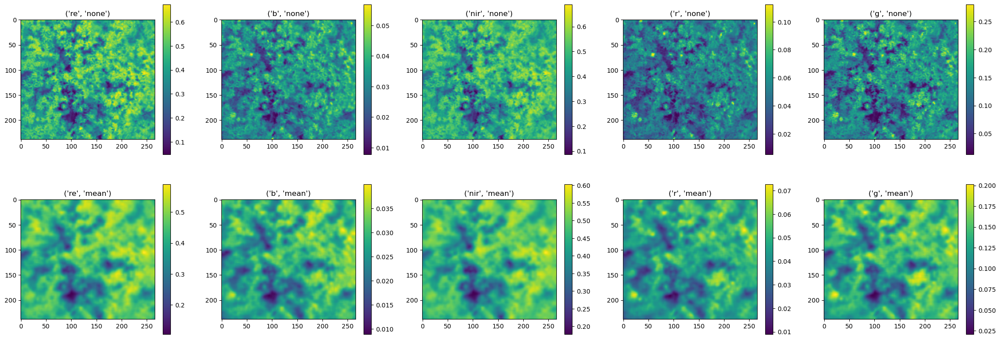

In [49]:
fig, ax =  plt.subplots(2, 5, figsize=(5.6*5, 4.8*2))
for ax_, idx, title in zip(ax.flatten(), range(len(ax.flatten())), selected):
    img = ax_.imshow(df['sel_features'].iloc[0][:,:,idx])
    ax_.set_title(title)
    plt.colorbar(img)

In [ ]:
df[['species', 'phase']].iloc[0]

In [ ]:
def crop_center(img,cropx,cropy):
    y,x = img.shape[:2]
    if y < cropy or x < cropx:
        return float('NaN')
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

In [ ]:
df_croppable = df['sel_features'][df['sel_features'].apply(lambda x: True if x.shape[0] > 64 and x.shape[1] > 64 else False)]

In [ ]:
len(df_croppable)

In [ ]:
catted = np.concatenate(list(df_croppable\
                                 .apply(lambda x: crop_center(x, 64, 64))\
                                 .apply(lambda x: x.reshape(-1, 10))))

In [ ]:
catted = pd.DataFrame(catted)

In [56]:
catted.columns = selected

In [57]:
catted = pd.melt(catted)

In [58]:
import warnings
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")

<Axes: xlabel='value', ylabel='Density'>

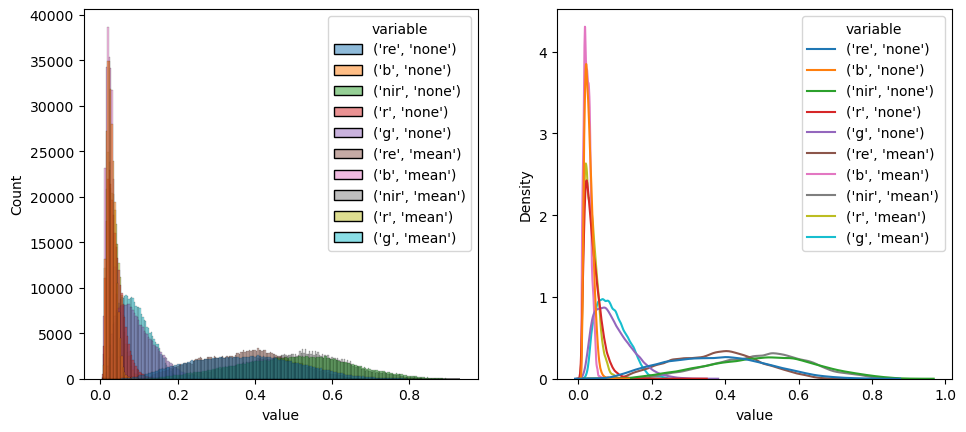

In [59]:
fig, ax = plt.subplots(1, 2, figsize=(5.6*2, 4.8))
sns.histplot(catted,
             x='value',
             hue='variable',
             bins=256,
             ax=ax[0])
sns.kdeplot(catted,
            x='value',
            hue='variable',
            ax=ax[1])

In [60]:
catted = np.concatenate(list(df_croppable.iloc[:1]\
                                 .apply(lambda x: crop_center(x, 64, 64))\
                                 .apply(lambda x: x.reshape(-1, 10))))

In [61]:
catted = pd.DataFrame(catted)

In [62]:
catted.columns = selected

In [63]:
catted = pd.melt(catted)

<Axes: xlabel='value', ylabel='Density'>

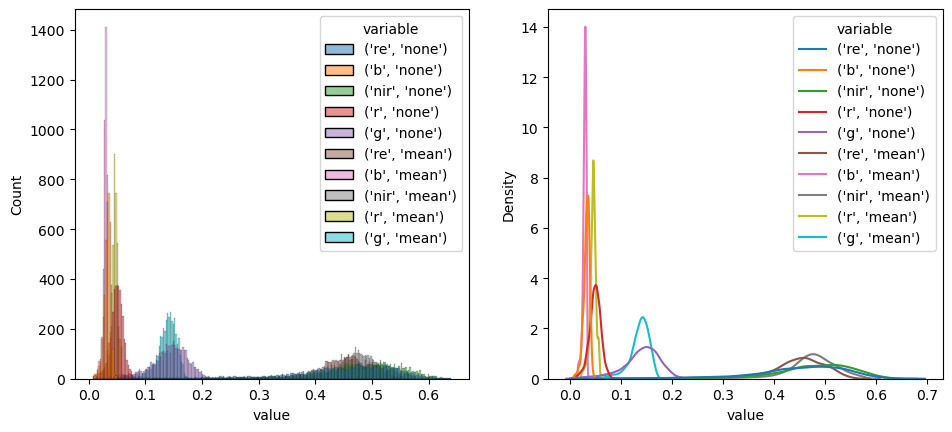

In [64]:
fig, ax = plt.subplots(1, 2, figsize=(5.6*2, 4.8))
sns.histplot(catted.iloc[:64*64*10],
             x='value',
             hue='variable',
             bins=256,
             ax=ax[0])
sns.kdeplot(catted.iloc[:64*64*10],
            x='value',
            hue='variable',
            ax=ax[1])

### Principal Components Analysis -- One image

In [65]:
from sklearn.decomposition import PCA

In [66]:
pcas = []

arr = df['sel_features'].iloc[0]

arr_filt = np.zeros((arr.shape[0], arr.shape[1], 10))

for j in range(len(selected)):
    #Applying to red channel and then applying inverse transform to transformed array.
    pca = PCA(5)
    pca_ = pca.fit_transform(arr[:,:,j])
    inverted = pca.inverse_transform(pca_)
    arr_filt[:,:,j] = inverted
    pcas.append(pca)

In [67]:
evrs = pd.DataFrame([i.explained_variance_ratio_ for i in pcas])

In [68]:
evrs = evrs.reset_index()
evrs['index'] = selected
evrs.columns = ['feature'] + list(evrs.columns)[1:]

In [69]:
evrs = pd.melt(evrs, id_vars=['feature'], var_name='component #', value_name='explained variance')

In [70]:
evrs['cum. EV'] = np.cumsum(evrs['explained variance'])

In [71]:
selected_ordered = evrs[evrs['component #'] == 0].sort_values('cum. EV', ascending=False)['feature']

<Axes: xlabel='component #', ylabel='cum. EV'>

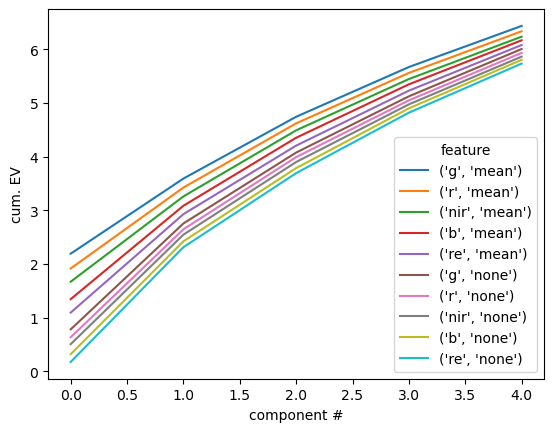

In [72]:
sns.lineplot(evrs,
             x='component #',
             y='cum. EV',
             hue='feature',
             hue_order=selected_ordered)

Text(0, 0.5, 'post-pca filtering')

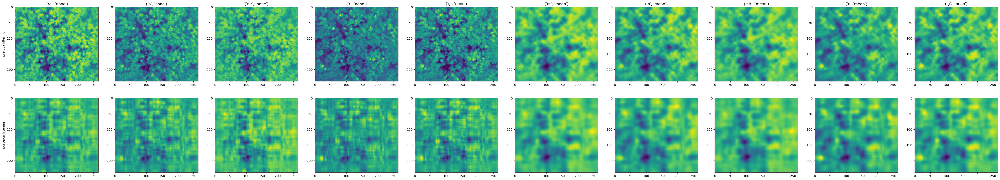

In [73]:
fig, ax = plt.subplots(2, 10, figsize=(5.6*10, 4.8*2))
for col, col_idx in zip(ax.T, range(len(ax.T))):
    corrected_index = selected.index(selected_ordered[col_idx])
    col[0].imshow(arr[:,:,corrected_index])
    col[1].imshow(arr_filt[:,:,corrected_index])
    col[0].set_title(selected[corrected_index])
ax[0][0].set_ylabel("pre-pca filtering")
ax[1][0].set_ylabel("post-pca filtering")

## Do the PCA on all our data

In [74]:
def aaron_pca(arr):
    arr_filt = np.zeros((arr.shape[0], arr.shape[1], 10))
    for j in range(len(selected)):
        #Applying to red channel and then applying inverse transform to transformed array.
        pca = PCA(5)
        pca_ = pca.fit_transform(arr[:,:,j])
        inverted = pca.inverse_transform(pca_)
        arr_filt[:,:,j] = inverted
    return arr_filt

In [75]:
df['post_pca'] = df['sel_features'].progress_apply(aaron_pca)

  0%|          | 0/67 [00:00<?, ?it/s]

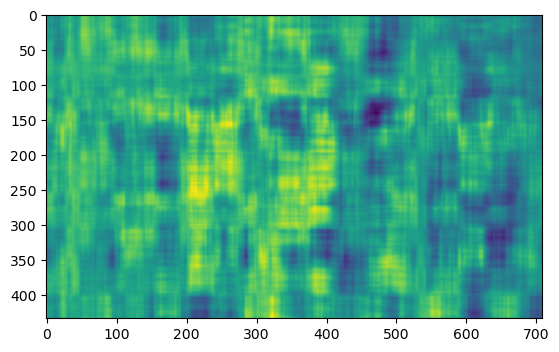

In [76]:
plt.imshow(df['post_pca'].iloc[2][:,:,0])

## Implement a random crop-and-stretch transformation

In [61]:
transform = torchvision.transforms.RandomResizedCrop(
    size=(250,250),
    scale=((64/250)**2,1),
    ratio=(1/2, 2),
    interpolation=torchvision.transforms.InterpolationMode.BICUBIC,
    antialias=True
)

In [58]:
def rand_crop_stretch(pre_trans, n):
    return\
        [rearrange(
            transform(torch.Tensor(rearrange(pre_trans, 'h w c -> c h w'))).numpy(),
            'c h w -> h w c')
         for i in range(n)]

In [59]:
def embed_tf(x):
    return tf.math.l2_normalize(fm_old(x.reshape((-1, *x.shape))), axis=1, epsilon=1e-10).numpy()
def embed_pt(x):
    return torch.nn.functional.normalize(fm(torch.Tensor(x.reshape((-1, *x.shape))).to(device)), dim=1, eps=1e-10).detach().cpu().numpy()

In [63]:
df_augment = df.copy()

In [64]:
df_augment['pre_pca_augment'] = df['sel_features'].progress_apply(lambda x: rand_crop_stretch(x, 20))

  0%|          | 0/66 [00:00<?, ?it/s]

In [68]:
#df_augment['post_pca_augment'] = df['post_pca'].progress_apply(lambda x: rand_crop_stretch(x, 20))

In [69]:
def whiten_image(x):
    return (x-x.mean(axis=(0,1), keepdims=True))/x.std(axis=(0,1), keepdims=True)

In [70]:
#df_augment['pre_pca_whitened_augment'] = df['sel_features'].progress_apply(lambda x: [whiten_image(i) for i in rand_crop_stretch(x, 20)])

In [ ]:
#df_augment['post_pca_whitened_augment'] = df['post_pca'].progress_apply(lambda x: [whiten_image(i) for i in rand_crop_stretch(x, 20)])

In [71]:
df_augment = df_augment.explode(['pre_pca_augment'])#, 'post_pca_augment', 'pre_pca_whitened_augment', 'post_pca_whitened_augment'])

In [72]:
with torch.no_grad():
    df_augment['pre_pca_augment_embeddings'] = df_augment['pre_pca_augment'].progress_apply(embed_tf)

  0%|          | 0/1320 [00:00<?, ?it/s]

In [ ]:
#df_augment['post_pca_augment_embeddings'] = df_augment['post_pca_augment'].progress_apply(embed_tf)

In [ ]:
#df_augment['pre_pca_whitened_augment_embeddings'] = df_augment['pre_pca_whitened_augment'].progress_apply(embed_tf)

In [630]:
#df_augment['post_pca_whitened_augment_embeddings'] = df_augment['post_pca_whitened_augment'].progress_apply(embed_tf)

  0%|          | 0/1340 [00:00<?, ?it/s]

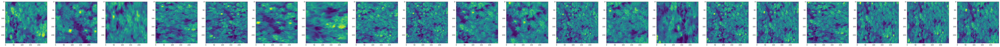

In [197]:
post_trans = list(df_augment.iloc[:20]['pre_pca_augment'])
fig, ax = plt.subplots(1, 20, figsize=(5.6*20, 4.8))
for ax_, idx in zip(ax.flatten(), range(len(ax.flatten()))):
    ax_.imshow(post_trans[idx][:,:,3])

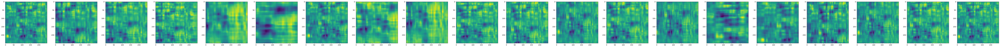

In [198]:
post_trans = list(df_augment.iloc[:20]['post_pca_augment'])
fig, ax = plt.subplots(1, 20, figsize=(5.6*20, 4.8))
for ax_, idx in zip(ax.flatten(), range(len(ax.flatten()))):
    ax_.imshow(post_trans[idx][:,:,3])

In [74]:
df_augment.to_pickle('df_augment.pickle')

In [54]:
df_augment = pd.read_pickle('df_augment.pickle')

In [55]:
def umap_ify(colname, suptitle):
    from umap import UMAP
    reducer = UMAP(n_components=2,
                   metric='euclidean',
                   n_neighbors=5,
                   min_dist=0.1)
    
    df_augment[colname].iloc[0].shape
    
    X = reducer.fit_transform(np.stack(list(df_augment[colname].apply(lambda x: x[0]))))
    X_train =\
        reducer.fit_transform(np.stack(list(df_augment[df_augment['phase'] == '10May2021'][colname].apply(lambda x: x[0]))))
    X_test =\
        reducer.fit_transform(np.stack(list(df_augment[df_augment['phase'] == '18Dec2020'][colname].apply(lambda x: x[0]))))
    
    species = df['species'].unique()
    
    fig, ax = plt.subplots(2, 2, figsize=(5.6*2, 4.8*2))
    sns.scatterplot(
        df_augment,
        x=X[:,0], y=X[:,1],
        hue='phase',
        palette='tab20',
        s=4,
        legend=True,
        ax=ax[0][0])
    sns.scatterplot(
        df_augment,
        x=X[:,0], y=X[:,1],
        hue='species', hue_order=species,
        palette='tab20',
        s=4,
        legend=True,
        ax=ax[0][1])
    sns.scatterplot(
        df_augment[df_augment['phase'] == '10May2021'],
        x=X_train[:,0], y=X_train[:,1],
        hue='species', hue_order=species,
        palette='tab20',
        s=4,
        legend=False,
        ax=ax[1][0])
    sns.scatterplot(
        df_augment[df_augment['phase'] == '18Dec2020'],
        x=X_test[:,0], y=X_test[:,1],
        hue='species', hue_order=species,
        palette='tab20',
        s=4,
        legend=False,
        ax=ax[1][1])
    sns.move_legend(ax[0][0], "upper left", bbox_to_anchor=(2.2, 1))
    sns.move_legend(ax[0][1], "upper left", bbox_to_anchor=(1, 0.77))
    ax[0][0].set_title("UMAP Train and Test, capture shown")
    ax[0][1].set_title("UMAP Train and Test, species shown")
    ax[1][0].set_title("UMAP Train/10May2021, species shown")
    ax[1][1].set_title("UMAP Test/18Dec2021, species shown")
    #fig.tight_layout()
    fig.suptitle(suptitle)

E:\miniconda3\envs\work_env\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
E:\miniconda3\envs\work_env\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
E:\miniconda3\envs\work_env\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
E:\miniconda3\envs\work_env\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.

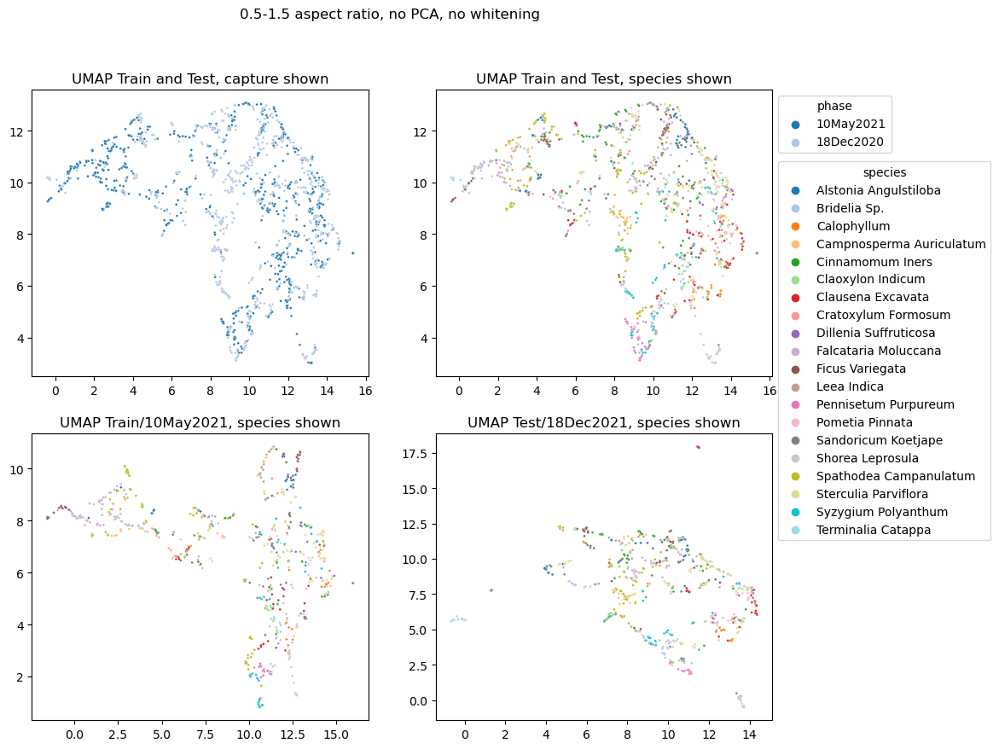

In [73]:
umap_ify('pre_pca_augment_embeddings', '0.5-1.5 aspect ratio, no PCA, no whitening')

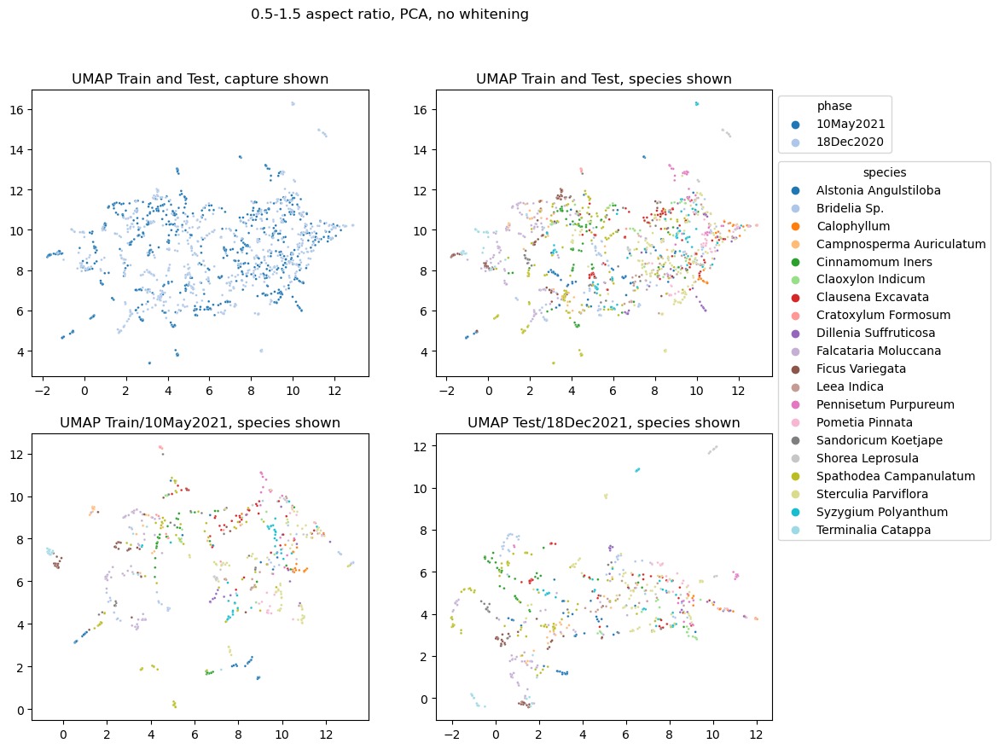

In [768]:
umap_ify('post_pca_augment_embeddings', '0.5-1.5 aspect ratio, PCA, no whitening')

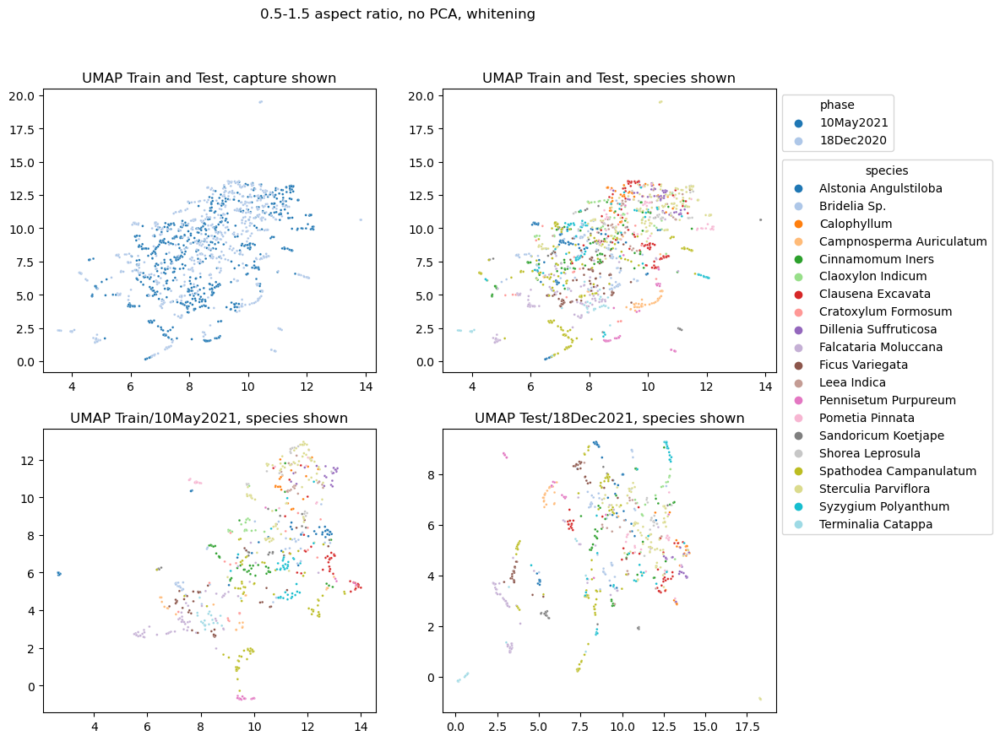

In [769]:
umap_ify('pre_pca_whitened_augment_embeddings', '0.5-1.5 aspect ratio, no PCA, whitening')

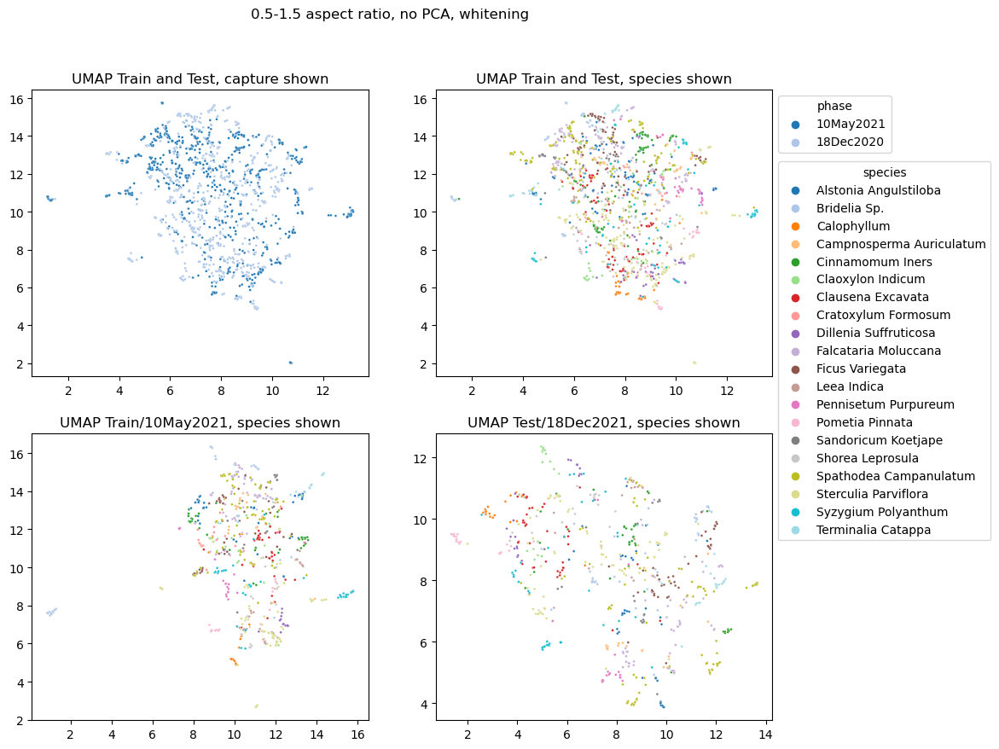

In [770]:
umap_ify('post_pca_whitened_augment_embeddings', '0.5-1.5 aspect ratio, no PCA, whitening')

## What's the distribution of a node's distances to other nodes?

In [214]:
colnames = ['pre_pca_augment_embeddings', 'post_pca_augment_embeddings', 'pre_pca_whitened_augment_embeddings']

In [226]:
np.stack(list(df_augment['pre_pca_augment_embeddings'])).squeeze().shape

(1340, 128)

In [227]:
dist_mats = {i: sklearn.metrics.pairwise_distances(np.stack(list(df_augment[i])).squeeze(), n_jobs=6) for i in colnames}

  0%|          | 0/3 [00:00<?, ?it/s]

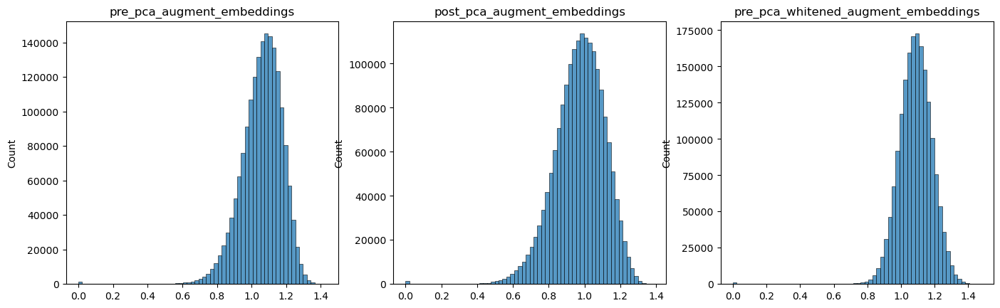

In [284]:
fig, ax = plt.subplots(1, 3, figsize=(5.6*3, 4.8))
for col, colname in tqdm(zip(ax.T, colnames), total=len(colnames)):
    sns.histplot(dist_mats[colname].flatten(), ax=col, bins=64)
    #col.set_ylim(0, 2_000)
    #sns.kdeplot(dist_mats[colname].flatten(), ax=col[1])
    col.set_title(colname)

## What if we look at the distances to the kth nearest neighbour?

In [243]:
colnames

['pre_pca_augment_embeddings',
 'post_pca_augment_embeddings',
 'pre_pca_whitened_augment_embeddings']

In [646]:
k_neighbours = {i: sklearn.neighbors.kneighbors_graph(np.stack(list(df_augment[i])).squeeze(), n_neighbors=201, n_jobs=6, mode='distance') for i in colnames}

<Axes: ylabel='Density'>

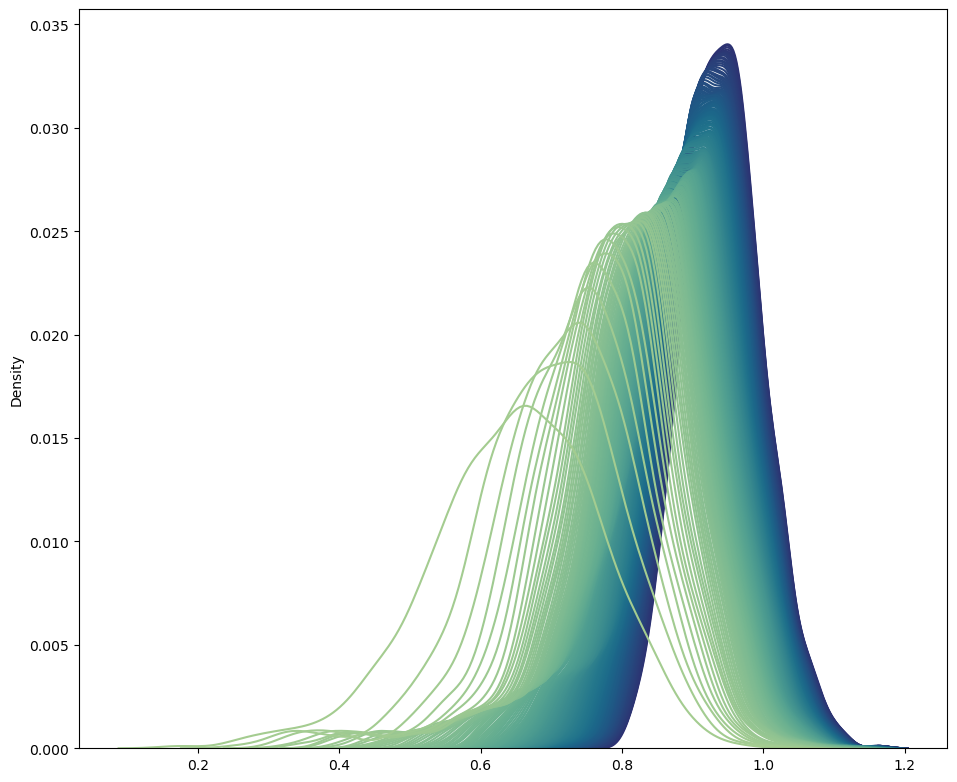

In [640]:
fig, ax = plt.subplots(1, 1, figsize=(5.6*2, 4.8*2))
sns.kdeplot(k_neighbours['pre_pca_augment_embeddings'].toarray()[np.nonzero(k_neighbours['pre_pca_augment_embeddings'])].reshape(1340, 201),
            ax=ax, legend=False, palette='crest')
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

<Axes: ylabel='Density'>

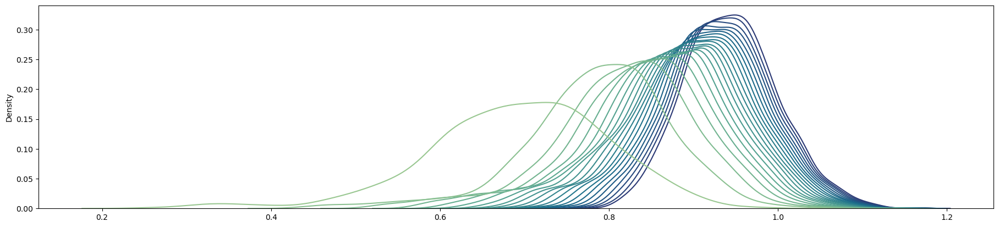

In [650]:
fig, ax = plt.subplots(1, 1, figsize=(5.6*4, 4.8))
sns.kdeplot(k_neighbours['pre_pca_augment_embeddings'].toarray()[np.nonzero(k_neighbours['pre_pca_augment_embeddings'])].reshape(1340, 201)[:,[1] + list(range(10, 210, 10))],
            ax=ax, legend=False, palette='crest')
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## Can we dump the connectivity graph to disk?

In [750]:
colnames

['pre_pca_augment_embeddings',
 'post_pca_augment_embeddings',
 'pre_pca_whitened_augment_embeddings']

In [751]:
k_neighbours = dict()

In [752]:
for colname in colnames:
    nn = sklearn.neighbors.NearestNeighbors(n_neighbors=101)
    X = np.stack(list(df_augment[colname])).squeeze()
    nn.fit(X)
    dists, preds = nn.kneighbors(X)
    k_neighbours[colname] = dists, preds

In [753]:
dists, preds = k_neighbours['pre_pca_augment_embeddings']

In [754]:
G = nx.DiGraph()

In [755]:
nodes = []
for node_id, index, phase, species in tqdm(zip(range(len(df_augment)), df_augment.index, df_augment['phase'], df_augment['species'])):
    nodes.append((node_id, dict(index=index, phase=phase, species=species)))

0it [00:00, ?it/s]

In [756]:
G.add_nodes_from(nodes)

In [757]:
edges = []
for row in tqdm(range(1340)):
    for col in range(101):
        from_ = row
        to_ = preds[row][col]
        weight = dists[row][col]
        n = col
        if n == 0:
            continue
        edges.append((from_, to_, dict(weight=weight, nth_neighbour=n)))

  0%|          | 0/1340 [00:00<?, ?it/s]

In [758]:
G.add_edges_from(edges)

In [759]:
nx.write_gexf(G, 'pre_pca_augment_embeddings.gexf')

In [760]:
gc.collect()

1362

In [761]:
_ = [edge[0] for edge in edges if edge[2]['nth_neighbour'] == 1]
[i for i in G.nodes if i not in _]

[]

## Distances of "within" vs "without" 1NN?

In [762]:
within_dists = [edge[2]['weight'] for edge in edges if edge[2]['nth_neighbour'] == 1 and G.nodes[edge[0]]['index'] == G.nodes[edge[1]]['index']]

In [763]:
without_dists = [edge[2]['weight'] for edge in edges if edge[2]['nth_neighbour'] == 1 and G.nodes[edge[0]]['index'] != G.nodes[edge[1]]['index']]

<Axes: ylabel='Count'>

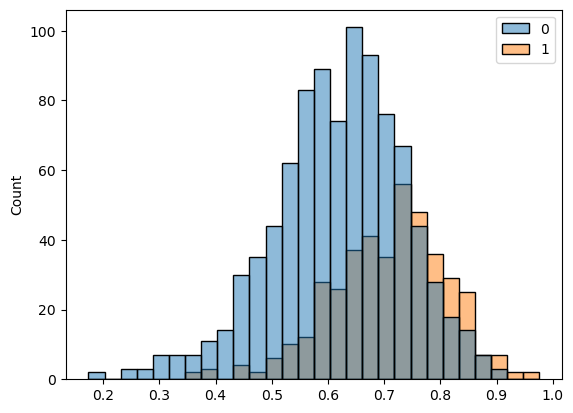

In [764]:
sns.histplot([within_dists, without_dists])

Text(0.5, 0.98, 'Blue is same pre-augmentation image, orange different')

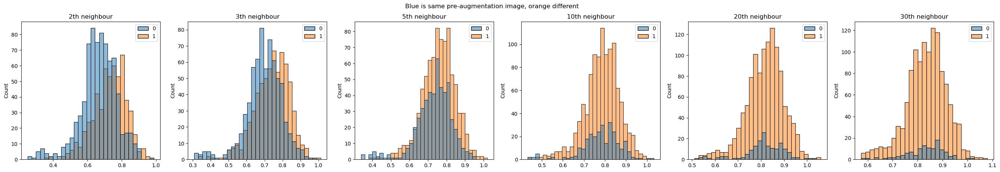

In [765]:
nth_neighbours = [2, 3, 5, 10, 20, 30]
fig, ax = plt.subplots(1, 6, figsize=(5.6*6, 4.8))
for col, nth_neighbour in zip(ax, nth_neighbours):
    within_dists = [edge[2]['weight'] for edge in edges if edge[2]['nth_neighbour'] == nth_neighbour and G.nodes[edge[0]]['index'] == G.nodes[edge[1]]['index']]
    without_dists = [edge[2]['weight'] for edge in edges if edge[2]['nth_neighbour'] == nth_neighbour and G.nodes[edge[0]]['index'] != G.nodes[edge[1]]['index']]
    sns.histplot([within_dists, without_dists], ax=col)
    col.set_title("{}th neighbour".format(nth_neighbour))
fig.suptitle("Blue is same pre-augmentation image, orange different")